In [1]:
# Import necessary packages

import numpy as np
import matplotlib.pyplot as plt
import seaborn as sns
import pandas as pd
from tqdm import tqdm, trange
import sctop as top
from itertools import combinations
from scipy.special import softmax

# Settings for making nice plots

sns.set(context='talk', color_codes=True, palette='deep', style='whitegrid', font_scale=1.2,
        rc={'mathtext.fontset': 'cm', 'xtick.direction': 'in','ytick.direction': 'in',
            'figure.dpi':100, 'text.usetex':False}) #'axes.linewidth': 1.5

# 1. Load data
## Load gene expression profiles of alveolar types
The gene expression profiles of mouse early epithelial lung cells and adult alveolar cells will be used as the stored patterns $\xi^{\mu}_i$. They come from the Zepp et al. lung developmental atlas ([link](https://www.science.org/doi/10.1126/science.abc3172)) and mouse samples collected by the Kotton lab ([link](https://www.ncbi.nlm.nih.gov/geo/query/acc.cgi?acc=GSM6046035)).

In [2]:
mca, mca_metadata = top.load_basis('MC-KO')
lung_dev, lung_dev_metadata = top.load_basis('LD')

epithelial = lung_dev['Lung Early Epithelium Cell E12 LD21']
at1 = mca['Lung AT1 Cell WK6 KO22']
at2 = mca['Lung AT2 Cell WK6 KO22']

genes_in_common = np.intersect1d(epithelial.index, at1.index)
attractor_states = pd.concat([at1.loc[genes_in_common],
                              at2.loc[genes_in_common],
                              epithelial.loc[genes_in_common]
                             ], axis = 1)

attractor_states.columns = ['at1', 'at2', 'early epithelium']

N, P = attractor_states.shape

## Load list of marker genes
These marker genes are the same as those listed in the appendix of [Yampolskaya et al. 2023](https://doi.org/10.1242/dev.201873). In the simulations, they can be measured over the course of cell fate transitions to track gene expression dynamics.

In [3]:
type_signatures = pd.read_csv('./herriges_cell_type_signatures.csv')
AT1_signature = type_signatures.loc[:, 'Mouse_AT1'].dropna()

AT1_signature = np.intersect1d(genes_in_common, AT1_signature)

In [4]:
# Helper function for displaying color bar of gene activity
from matplotlib.cm import ScalarMappable

def create_colorbar(data, label, colormap='rocket_r', **kwargs):
#     ax = ax or plt.gca()
    
    cmap = plt.get_cmap(colormap)
    scalarmap = ScalarMappable(norm=plt.Normalize(min(data), max(data)),
                               cmap=cmap)
    scalarmap.set_array([])
    plt.colorbar(scalarmap, label=label, **kwargs)
    
    return cmap

# 2. Define functions and classes for simulating attractor networks

## Define gradient functions and attractors for each landscape

In [5]:
# Define potentials by their gradients and the approximate positions of their attractors

def triple_cusp_grad(x, y, params):
    grad_x = 6*x**5 - 4*x**3 + 2*x + 4*x*y + params['f']
    grad_y = 16*y**3 - 2*y + 2*x**2 + params['k']    
    return grad_x, grad_y

def het_flip_grad(x, y, params):
    grad_x = 4*x**3 + 4*x*y + params['f'] 
    grad_y = 4*y**3 - 3*y**2 + 2*x**2 - 2*y + params['k'] 
    return grad_x, grad_y

def double_cusp_grad(x, y, params):
    grad_x = 4*x**3 + 8*x*y + params['f']
    grad_y = 4*y**3 - 3*y**2 + 4*x**2 + 2*y - params['k']
    return grad_x, grad_y

triple_cusp_coords = {'y0': 0.345, 
                     'x1': 0.838,
                     'y1': -0.537
                    }

# heteroclinic flip:
het_flip_coords = {'y0': 0.82,
                    'x1': 0.964,
                    'y1': -0.877
                   }

# double cusp:
double_cusp_coords = {'y0': 0.085,
                      'x1': 1.349,
                      'y1': -0.911
                      }

## Define matrices for converting between $(\tilde{x}, \tilde{y})$ coordinates and $(m_0, m_1, m_2)$

In [6]:
# We have some potential of the form V(x, y)
# To calculate V(m), we project between m-space to xy-space
# To find the matrix that transforms between x and m, we need
# translations, rotations, and scaling in 4 dimensions

# In other words, this takes (0, y0) to (0, 0, 1)
# (x1, y1) -> (0, 1, 0), and (-x1, y1) -> (1, 0, 0)

# First we define matrix M, which moves the 2-dimensional triangle vertices
# to the vertices of a simplex on three axes

T = np.array([[1, 0, 0, -1],
              [0, 1, 0, 0],
              [0, 0, 1, 0],
              [0, 0, 0, 1]])

Tinv = np.array([[1, 0, 0, 1],
                 [0, 1, 0, 0],
                 [0, 0, 1, 0],
                 [0, 0, 0, 1]])

X = np.array([[1, 0, 0, 0],
              [0, 0, -1, 0],
              [0, 1, 0, 0],
              [0, 0, 0, 1]])

Xinv = np.array([[1, 0, 0, 0],
                 [0, 0, 1, 0],
                 [0, -1, 0, 0],
                 [0, 0, 0, 1]])

sq2 = np.sqrt(2) / 2
psi = np.arcsin(np.sqrt(2/3))

Y = np.array([[sq2, 0, sq2, 0],
              [0, 1, 0, 0],
              [-sq2, 0, sq2, 0],
              [0, 0, 0, 1]])

Yinv = np.array([[sq2, 0, -sq2, 0],
                 [0, 1, 0, 0],
                 [sq2, 0, sq2, 0],
                 [0, 0, 0, 1]])

Z = np.array([[np.cos(psi), -np.sin(psi), 0, 0],
              [np.sin(psi), np.cos(psi), 0, 0],
              [0, 0, 1, 0],
              [0, 0, 0, 1]])

M = np.dot(Tinv, np.dot(Xinv, np.dot(Yinv, np.dot(Z, np.dot(Y, np.dot(X, T))))))

# Make adjustments for the positions of the attractors in xy-space
def generate_x_to_m_matrix(y0, x1, y1):
    S = np.array([
        [np.sqrt(2)/(2*x1), 0, 0, 0],
        [0, np.sqrt(3/2)/(y0 - y1), 0, 0],
        [0, 0, 1, 0],
        [0, 0, 0, 1]
    ])

    T1 = np.array([
        [1, 0, 0, 0],
        [0, 1, 0, -np.sqrt(2)/2 - (y1 * np.sqrt(3/2))/(y0 - y1)],
        [0, 0, 1, 0],
        [0, 0, 0, 1]
    ])

    theta = (3 * np.pi)/4
    R1 = np.array([
        [np.cos(theta), -np.sin(theta), 0, 0],
        [np.sin(theta), np.cos(theta), 0, 0],
        [0, 0, 1, 0],
        [0, 0, 0, 1]
    ])
    
    return np.dot(M, np.dot(R1, np.dot(T1, S)))
    
def initialize_attractor_vectors(y0, x1, y1):
    attractor0 = np.array([[0],
                           [y0],
                           [0],
                           [1]
                        ])

    attractor1 = np.array([
        [x1],
        [y1],
        [0],
        [1]
    ])

    attractor2 = np.array([
        [-x1],
        [y1],
        [0],
        [1]
    ])

    return (attractor0, attractor1, attractor2)

## Define AttractorNetwork class for simulating landscape-driven Hopfield dynamics

In [7]:
class AttractorNetwork:
    """
    A class that simulates an attractor-based dynamical system with an evolving energy landscape.
    The system evolves toward stored attractor states under the influence of external gradients.
    """

    def __init__(self, dynamics_args, landscape_args):
        """
        Initialize the attractor network.

        Parameters:
        - dynamics_args: Dictionary containing 'stored_states' (matrix of gene expression profiles) and 'initial_state':
        
            dynamics_args = {
                'stored_states': attractor states stored as rows in a 2D array,
                'initial_state': the starting gene expression state (1D array)
            }
        
        - landscape_args: Dictionary containing 'start_params', 'attractor_coords', and 'gradients':
        
            landscape_args = {
                'start_params': dict of initial parameters for the energy landscape,
                'attractor_coords': coordinates for attractor projections in x-y space,
                'gradients': function returning gradients of the landscape w.r.t. x and y
            }
        
        """
        
        self.attractors = dynamics_args['stored_states'].copy()
        self.state = dynamics_args['initial_state'].copy()

        self.params = landscape_args['start_params'].copy()
        self.start_params = landscape_args['start_params']
        
        self.N = len(self.state)  # Number of elements in the state vector.
        self.temperature = 1 / (2 * self.N) # low temperature, so that there's not too much random jumping

        # Calculate the correlation matrix and its inverse.
        self.corr = (1 / self.N) * self.attractors.dot(self.attractors.T)
        self.inv_corr = np.linalg.inv(self.corr)

        # Unpack the attractor coordinates.
        self.x0, self.y0 = landscape_args['attractor_coords'][0]
        self.x1, self.y1 = landscape_args['attractor_coords'][1]
        
        self.x_hat = np.array([1, 0, 0, 0])
        self.y_hat = np.array([0, 1, 0, 0])
        
        x_to_m = generate_x_to_m_matrix(self.y0, self.x1, self.y1)
        self.m_to_x = np.linalg.inv(x_to_m)
        
        self.hx = np.dot(self.x_hat, self.m_to_x)
        self.hy = np.dot(self.y_hat, self.m_to_x)
        
        self.gradients = landscape_args['gradients']

        self.rng = np.random.default_rng()
        
    def dynamics(self):
        """
        Compute the change in the system's state based on attractor dynamics
        and the gradient of the external potential landscape.
        
        Returns:
        - A vector representing the change in state.
        """
        
        m_up = (1/self.N)*self.attractors.dot(self.state) # upper index/contravariant
        m_low = self.inv_corr.dot(m_up) # lower index/covariant
        
        m_low_4d = np.array([*m_low, 1])
        
        x = np.dot(self.hx, m_low_4d)
        y = np.dot(self.hy, m_low_4d)
        
        inv_corr_4d = np.vstack((self.inv_corr, np.array([0, 0, 0])))
        inv_corr_4d = np.hstack((inv_corr_4d, np.array([0, 0, 0, 1]).reshape(-1, 1)))
        
        x_chain = np.dot(self.hx, inv_corr_4d)
        y_chain = np.dot(self.hy, inv_corr_4d)
        
        grad_x, grad_y = self.gradients(x, y, self.params)
        
        potential_grad = grad_x*x_chain + grad_y*y_chain
        potential_grad = potential_grad[:3]
        
        gradient_scale = 10 # adjustment factor to increase effect of gradient

        attraction = self.attractors.T.dot(
            softmax((1/self.temperature)*(m_low - gradient_scale*potential_grad))
        )
        
        return attraction - self.state

        
    def update(self):
        """
        Perform a single update of the network state using synchronous or asynchronous dynamics.
        """
        
        # "asynchronous updates": randomly choose which genes to update each time
        timing_scale = 10
        asynch = self.rng.binomial(1, 1/timing_scale, size=N) # allow 1 in __ genes to update at each step
        self.state += asynch*self.dynamics()/20
        
        # synchronous updates: all genes update simultaneously
#         self.state += self.dynamics()/20

    def increment_param(self, t, param, signal_bounds, finish_params):
        """
        Increment a specific bifurcation parameter gradually between start and end times.

        Parameters:
        - t: Current simulation time.
        - param: Parameter name to increment (e.g., 'f', 'k').
        - signal_bounds: Dict with 'start' and 'end' times for each parameter.
        - finish_params: Dict of final target values for parameters.
        """
        
        if (t > signal_bounds['start'][param]) and (t < signal_bounds['end'][param]):
            self.params[param] += (finish_params[param] - self.start_params[param])/(signal_bounds['end'][param] - signal_bounds['start'][param])

    def simulate(self, total_time, signal_bounds, finish_params, recorded_genes = None, add_noise = False):
        """
        Run a full simulation of the network over time, tracking magnetizations and optionally individual genes.

        Parameters:
        - total_time: Duration of the simulation.
        - signal_bounds: Dict specifying start/end times for each parameter change.
        - finish_params: Dict of final values for changing parameters.
        - recorded_genes: List of gene names (indices) to record over time.
        - add_noise: If True, adds dropout and Gaussian noise to measurements.

        Returns:
        - A pandas DataFrame containing time series of order parameters, magnetizations, and recorded genes.
        """

        magnetizations = []

        gene_dict = {}
        if recorded_genes is not None:
            for gene in recorded_genes:
                gene_dict[gene] = []

        t = 0
        time_interval = 1 # in minutes        
        while t < total_time:
            # Choose which parameters to increment
            self.increment_param(t, 'f', signal_bounds, finish_params)
            self.increment_param(t, 'k', signal_bounds, finish_params)
            
            if add_noise: # this just adds noise to the observations, not to the system
                detection_rate = 0.4
                dropout = self.rng.binomial(1, detection_rate, size=N)
                zero_indices = np.where(dropout == 0)[0]
                
                dropout_state = self.state.T.copy()
                dropout_state[zero_indices] = -1
                
                noise = self.rng.standard_normal(size=N)
                
                magnetizations += [(1/N)*self.attractors.dot(dropout_state + noise)]
                
            else:
                magnetizations += [(1/N)*self.attractors.dot(self.state.T)]
                
            if recorded_genes is not None:
                for gene in recorded_genes:
                    gene_dict[gene] += [self.state.loc[gene]]
            
            self.update()
            t += time_interval
                    
        magnetizations = pd.DataFrame(magnetizations)
        if len(magnetizations.columns[0]) < 2:
            magnetizations = pd.DataFrame(magnetizations, columns = ['m{}'.format(index) for index in range(self.attractors.shape[0])])
        order_params = self.inv_corr.dot(magnetizations.T)
        
        output_df = pd.concat([pd.DataFrame(order_params, index = magnetizations.columns).T, magnetizations, pd.DataFrame(gene_dict)], axis=1)

        if len(magnetizations.columns[0]) < 2:
            output_df = pd.concat([pd.DataFrame(order_params, index = ['a{}'.format(index) for index in range(self.attractors.shape[0])]).T,
                                magnetizations, pd.DataFrame(gene_dict)], axis=1)
        return output_df

# Triple cusp simulations

In [8]:
n_trials = 10
output_list = []
gene_list = []
signature_list = []
rng = np.random.default_rng()

total_time = 1000

landscape_args = {'start_params': {'f': 0, 'k': 0},
                  'attractor_coords': [[0, triple_cusp_coords['y0']], [triple_cusp_coords['x1'], triple_cusp_coords['y1']]],
                  'gradients': triple_cusp_grad,
                 }

dynamics_args = {'stored_states': attractor_states.T,
                 'rhos': [0, 10]
                }

for trial in trange(n_trials):
    # generate new initial coordinates for each trial
    dynamics_args['initial_state'] =  attractor_states['early epithelium'] + rng.standard_normal(size=N)

    attractor_network = AttractorNetwork(dynamics_args, landscape_args)
    
    simulation_args = {'total_time': total_time,
                        'signal_bounds': {'start': {'f': 600, 'k': 0},
                                          'end':   {'f': 700, 'k': 400}},
                        'finish_params': {'f': rng.choice([-0.3, 0.3]), 'k': 0.3},
                        'recorded_genes': ['Sftpc', *AT1_signature],
                        'add_noise': True
                        }
    
    output = attractor_network.simulate(**simulation_args)
    AT1_signatures = output[AT1_signature].mean(axis=1)
    output_list += [output.iloc[:, :3]]
    gene_list += [output[['Sftpc','Aqp5']]]
    signature_list += [AT1_signatures]

all_output = pd.concat(output_list, axis=0)
all_genes = pd.concat(gene_list, axis=0)
signature = pd.concat(signature_list, axis=0)

100%|██████████| 10/10 [00:44<00:00,  4.49s/it]


In [10]:
# Randomly select cells to exclude from plotting
# This is meant to simulate the fact that we don't see every cell at every step of differentiation

rng = np.random.default_rng()
drop_index_rv = rng.binomial(n=1, p=0.8, size=n_trials*total_time)
remaining_indices = np.where(drop_index_rv == 0)[0]
dropped_data = all_output.iloc[remaining_indices]

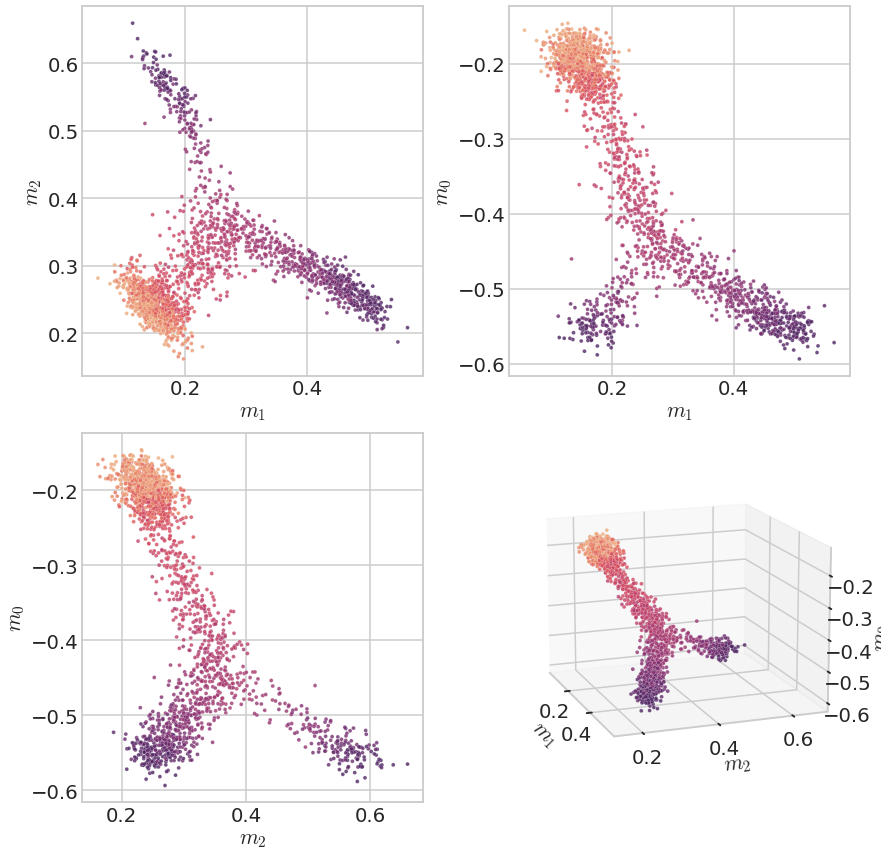

In [11]:
fig = plt.figure(figsize=(12,12))

label_dict = {'at1': '$m_1$',
              'at2': '$m_2$',
              'early epithelium': '$m_0$'
             }

kwargs = {"c": dropped_data.index,
          "cmap": sns.color_palette("flare", as_cmap=True),
          "alpha": 0.8,
          "s": 15,
          "edgecolors": 'white',
          "linewidth": 0.2
         }

for subplot_index, pair in enumerate(combinations(['at1','at2','early epithelium'], 2)):
    ax = fig.add_subplot(2, 2, subplot_index+1)

    ax.scatter(dropped_data[pair[0]], dropped_data[pair[1]], **kwargs)
    
    ax.set_xlabel(label_dict[pair[0]])
    ax.set_ylabel(label_dict[pair[1]])
               
view = [15, -20]
ax = fig.add_subplot(2, 2, 4, projection='3d')

ax.scatter(dropped_data['at1'], dropped_data['at2'], dropped_data['early epithelium'],**kwargs)
    
ax.view_init(elev=view[0], azim=view[1])

ax.set_xlabel('$m_1$', labelpad=10)
ax.set_ylabel('$m_2$', labelpad=10)
ax.set_zlabel('$m_0$', labelpad=10)
               
plt.tight_layout()

# plt.savefig("/project/biophys/scTOP analyses/Hopfield landscape paper/figs/triple cusp projections (colored by time).png", bbox_inches = "tight")
    
plt.show()

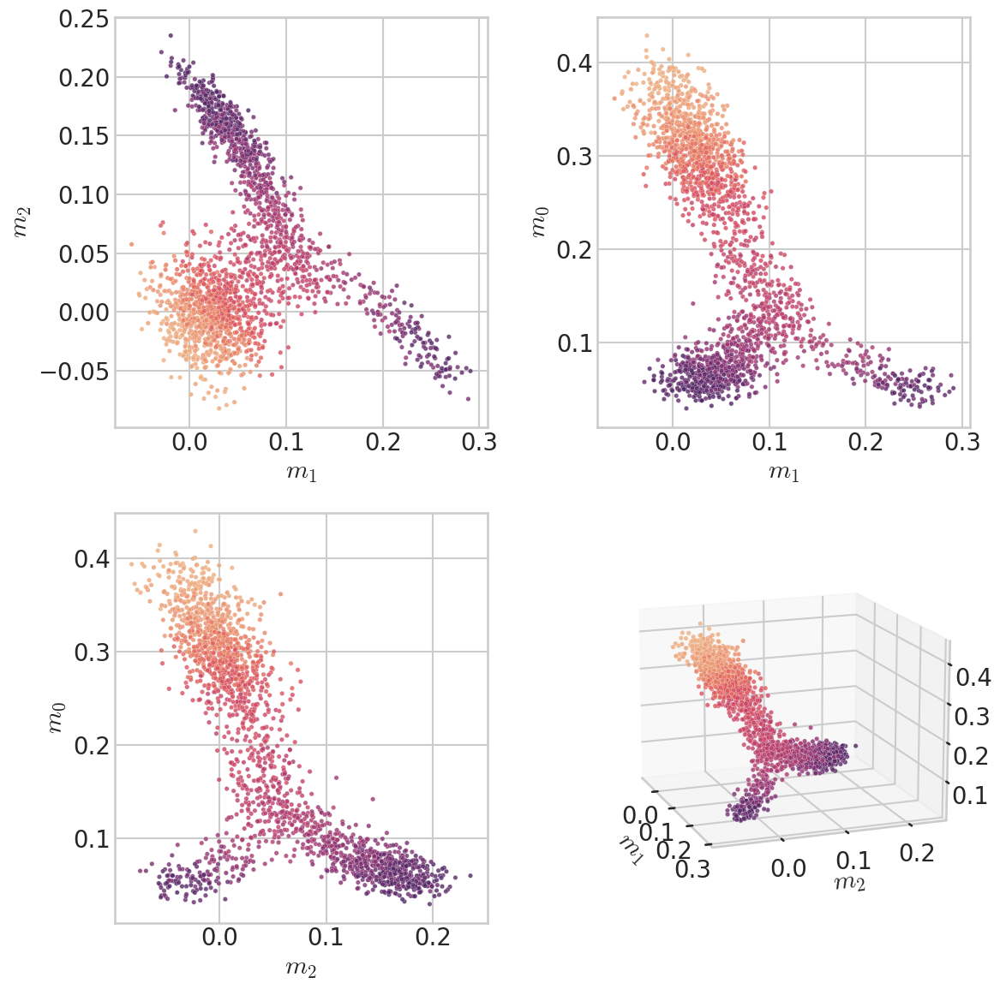

In [212]:
fig = plt.figure(figsize=(12,12))

label_dict = {'at1': '$m_1$',
              'at2': '$m_2$',
              'early epithelium': '$m_0$'
             }

kwargs = {"c": dropped_data.index,
          "cmap": sns.color_palette("flare", as_cmap=True),
          "alpha": 0.8,
          "s": 15,
          "edgecolors": 'white',
          "linewidth": 0.2
         }

for subplot_index, pair in enumerate(combinations(['at1','at2','early epithelium'], 2)):
    ax = fig.add_subplot(2, 2, subplot_index+1)

    ax.scatter(dropped_data[pair[0]], dropped_data[pair[1]], **kwargs)
    
    ax.set_xlabel(label_dict[pair[0]])
    ax.set_ylabel(label_dict[pair[1]])
               
view = [15, -20]
ax = fig.add_subplot(2, 2, 4, projection='3d')

ax.scatter(dropped_data['at1'], dropped_data['at2'], dropped_data['early epithelium'],**kwargs)
    
ax.view_init(elev=view[0], azim=view[1])

ax.set_xlabel('$m_1$', labelpad=10)
ax.set_ylabel('$m_2$', labelpad=10)
ax.set_zlabel('$m_0$', labelpad=10)
               
plt.tight_layout()

plt.savefig("/project/biophys/scTOP analyses/Hopfield landscape paper/figs/triple cusp projections (colored by time).png", bbox_inches = "tight")
    
plt.show()

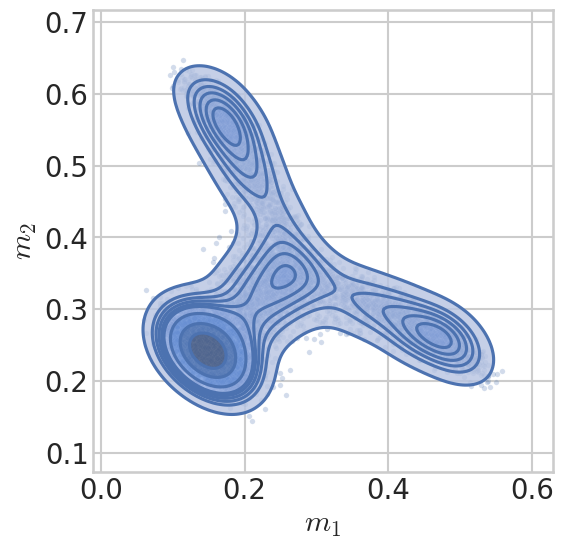

In [248]:
current_data = all_output

type1, type2 = 'at1', 'at2', 
fig = plt.figure(figsize=(6,6))
sns.scatterplot(x = current_data[type1], 
                y = current_data[type2],
                color = sns.color_palette()[0],
                alpha = 0.25,
                s = 15
               )

sns.kdeplot(x = current_data[type1], 
            y = current_data[type2],
            fill=True,
            alpha=0.8,
#             color='tab:blue'
           )

sns.kdeplot(x = current_data[type1], 
            y = current_data[type2],
#             color='tab:blue'
           )

plt.gca().set_aspect('equal')

plt.tight_layout()
plt.xlabel('$m_1$')
plt.ylabel('$m_2$')


plt.savefig("/project/biophys/scTOP analyses/Hopfield landscape paper/figs/triple cusp projections (kdeplot).png", bbox_inches = "tight")

plt.show()

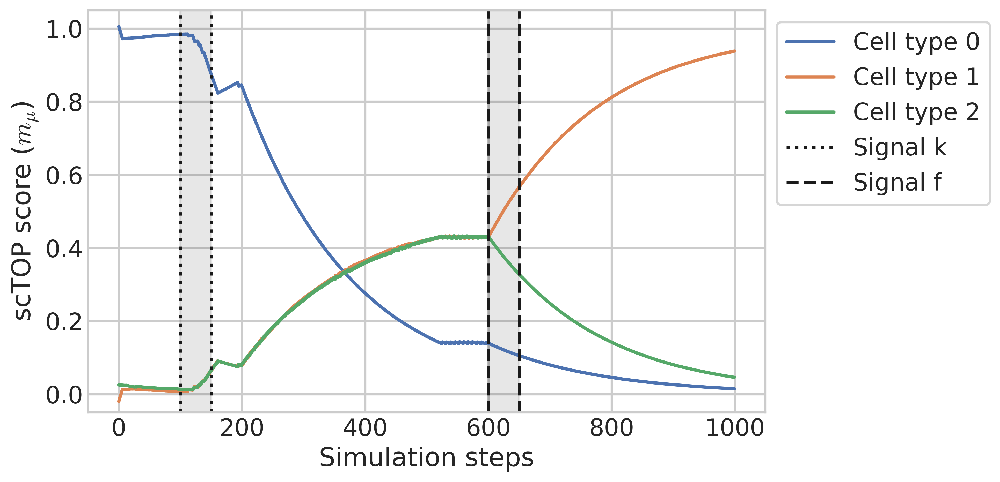

In [87]:
fig = plt.figure(figsize=(10,5))

separated_trials = pd.concat([all_output.iloc[0:total_time] for i in range(n_trials)], axis=1)

at1 = separated_trials['at1'].mean(axis=1)
at2 = separated_trials['at2'].mean(axis=1)
epithelium = separated_trials['early epithelium'].mean(axis=1)

plt.plot(range(total_time), epithelium, label='Cell type 0')
plt.plot(range(total_time), at1, label='Cell type 1')
plt.plot(range(total_time), at2, label='Cell type 2')

plt.axvline(x=simulation_args['signal_bounds']['start']['k'], label='Signal k', color='k', linestyle=':')
plt.axvline(x=simulation_args['signal_bounds']['end']['k'], color='k', linestyle=':')
plt.axvspan(simulation_args['signal_bounds']['start']['k'], simulation_args['signal_bounds']['end']['k'], alpha=0.1, color='k')

plt.axvline(x=simulation_args['signal_bounds']['start']['f'], label='Signal f', color='k', linestyle='--')
plt.axvline(x=simulation_args['signal_bounds']['end']['f'], color='k', linestyle='--')
plt.axvspan(simulation_args['signal_bounds']['start']['f'], simulation_args['signal_bounds']['end']['f'], alpha=0.1, color='k')

plt.legend(bbox_to_anchor=(1,1), loc="upper left",)


plt.ylim([-0.05, 1.05])

plt.xlabel('Simulation steps')
plt.ylabel('scTOP score ($m_{\mu}$)')


plt.tight_layout()

plt.savefig("/project/biophys/scTOP analyses/Hopfield landscape paper/figs/triple cusp 1 in 9 update (avg over 10 trials).png", bbox_inches = "tight")
plt.show()

/scratch/282988.1.ood/ipykernel_1571928/4206457691.py:37: UserWarning: Tight layout not applied. The left and right margins cannot be made large enough to accommodate all axes decorations.
  plt.tight_layout()


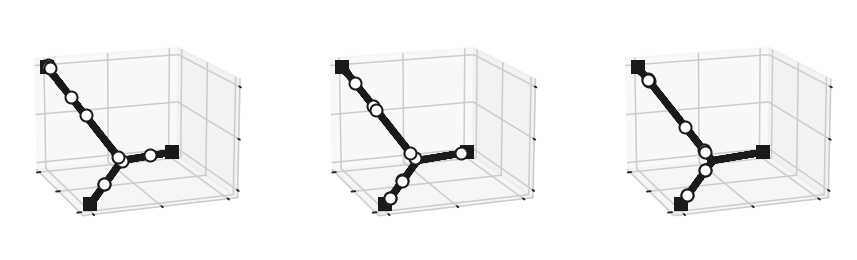

In [10]:
# Without noise

time_points = [0, 220, 400]
num_plots = len(time_points)
fig = plt.figure(figsize=(num_plots*5,5))

for i, time_point in enumerate(time_points):
    ax = fig.add_subplot(1, num_plots, i+1, projection='3d')

    this_plot = pd.concat([all_output.iloc[time_point + i*750] for i in range(n_trials)], axis=1)
    ax.plot(this_plot.loc['at1'], 
               this_plot.loc['at2'], 
               this_plot.loc['early epithelium'], 'o',
               markerfacecolor='white', markeredgecolor='k', markeredgewidth=2, markersize=12, zorder=10)
    
    ax.plot(all_output['at1'], 
               all_output['at2'], 
               all_output['early epithelium'], 'o',
               alpha=0.35, color='k', markersize=5, zorder = 2)
    
    ax.plot([1, 0, 0], 
           [0, 1, 0], 
           [0, 0, 1], 's',
           color='k', markeredgewidth=2, markersize=12, zorder=1)

    bounds = [-0.05, 1.05]
    ax.set_xlim(bounds)
    ax.set_ylim(bounds)
    ax.set_zlim(bounds)
    
    ax.set_xticklabels([])
    ax.set_yticklabels([])
    ax.set_zticklabels([])

    ax.view_init(elev=15, azim=-20)

plt.tight_layout()

# plt.savefig("/project/biophys/scTOP analyses/Hopfield landscape paper/figs/triple cusp fig 2.png", bbox_inches = "tight")
plt.show()

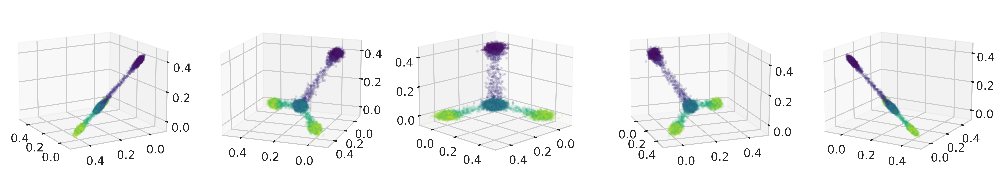

In [38]:
fig = plt.figure(figsize=(25,5))

views = [[15, 150], [15, 110], [15, 45], [15, -20], [15, -60]]
num_views = len(views)

for subplot_index, view in enumerate(views):
    ax = fig.add_subplot(1, num_views, subplot_index+1, projection='3d')

    ax.scatter(all_output['at1'], all_output['at2'], all_output['early epithelium'],
               alpha=0.1, c=all_output.index, s = 7, cmap='viridis')

#     ax.set_xlabel("AT1", labelpad=10)
#     ax.set_ylabel("AT2", labelpad=10)
#     ax.set_zlabel("Early epithelium", labelpad=10)
    
    ax.view_init(elev=view[0], azim=view[1])

plt.savefig("/project/biophys/scTOP analyses/Hopfield landscape paper/figs/triple cusp 3d noise.png", bbox_inches = "tight")

plt.show()

/scratch/245703.1.ood/ipykernel_1353962/2871769465.py:22: MatplotlibDeprecationWarning: Auto-removal of grids by pcolor() and pcolormesh() is deprecated since 3.5 and will be removed two minor releases later; please call grid(False) first.
  plt.colorbar()


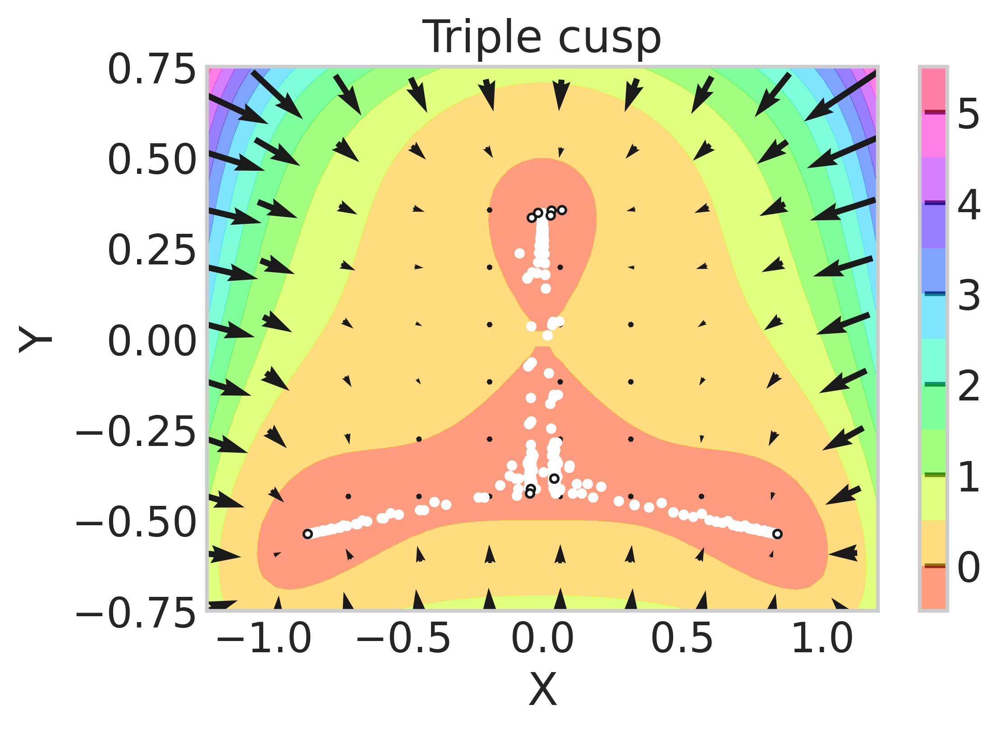

In [15]:
# plot the potential in x, y coords (can also plot as fn of m)

def potential_function(x, y, f, k):
    return x**6 - x**4 + x**2 + 4*y**4 - y**2 + 2*(x**2)*y + f*x + k*y

def potential_grad(x, y, f, k):
    grad_x = 6*x**5 - 4*x**3 + 2*x + 4*x*y + f
    grad_y = 16*y**3 - 2*y +2*x**2 + k
    return -grad_x, -grad_y

ylims = 0.75
time = 500

x = np.linspace(-1.2, 1.2, 50)
y = np.linspace(-ylims, ylims, 50)
X, Y = np.meshgrid(x, y)
f, k = 0, 0

Z = potential_function(X, Y, f, k)

plt.contourf(X, Y, Z, cmap="hsv", levels=10, alpha=0.5)
plt.colorbar()

x = np.linspace(-1.2, 1.2, 20)
y = np.linspace(-ylims, ylims, 20)
X, Y = np.meshgrid(x, y)

U, V = potential_grad(X, Y, f, k)
speed = np.sqrt(U**2 + V**2)

plt.quiver(X[::2, ::2], Y[::2, ::2], U[::2, ::2], V[::2, ::2],
           scale_units="inches", scale=20, width=0.009, pivot="mid")

df = all_output[['at1', 'at2', 'early epithelium']].T

ones_row = pd.DataFrame(np.ones((all_output.shape[0]))).T
ones_row.columns = df.columns
df = pd.concat([df, ones_row], axis=0)

X = np.dot(attractor_network.hx, df)
Y = np.dot(attractor_network.hy, df)

plt.scatter(x=X[::4], y=Y[::4], 
                s=10, color='white', zorder=3, linewidth=1)

plt.scatter(x=X[::time], y=Y[::time], 
                s=10, facecolors='white', edgecolor='k', zorder=3, linewidth=1)

plt.grid(False)

plt.xlabel('X')
plt.ylabel('Y')
plt.title('Triple cusp')

plt.show()

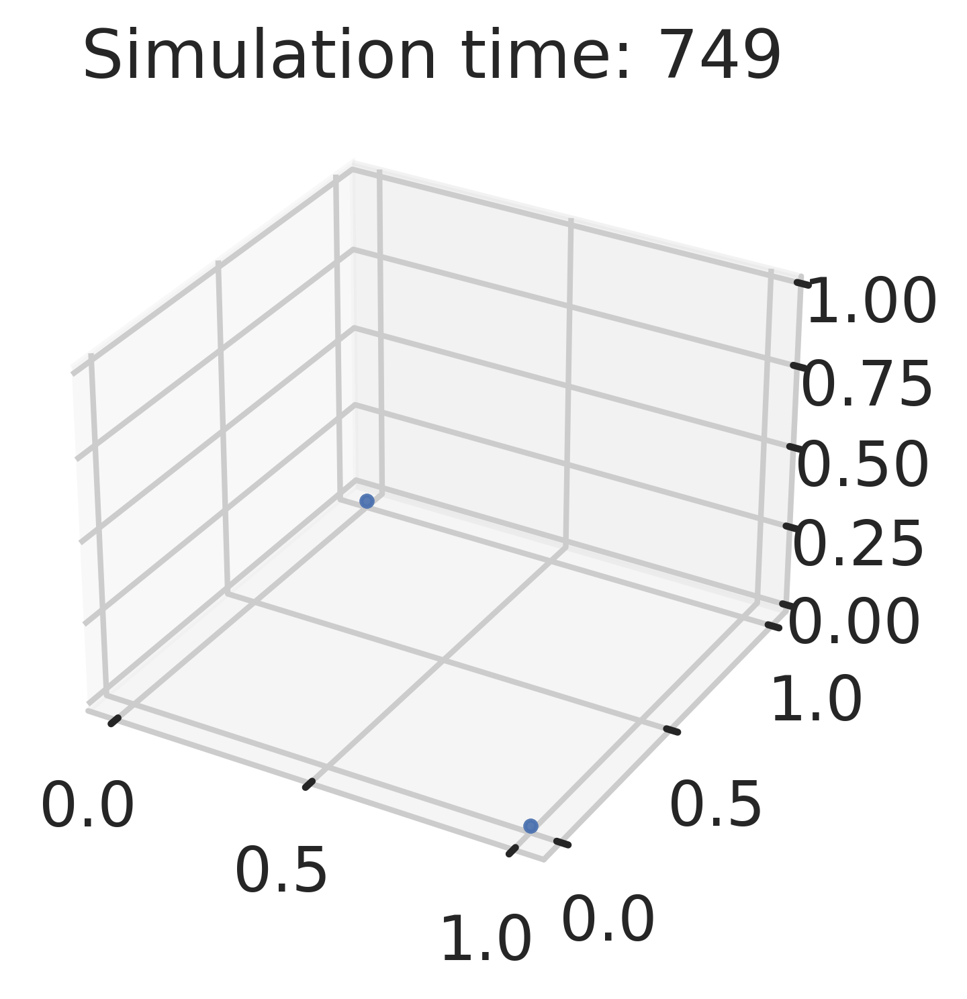

In [90]:
# Animation
from matplotlib.animation import FuncAnimation, PillowWriter
from IPython import display

typeX = 'at1' 
typeY = 'at2'
typeZ = 'early epithelium'
    
time_points = range(total_time)
# bounds = [-0.05, 0.4]
 
fig = plt.figure()
ax = fig.add_subplot(111, projection='3d')
# ax.view_init(elev=15, azim=-20)
# xdata, ydata = [], []
graph, = ax.plot([], [], [], 'bo', linestyle="", markersize=3, alpha=0.4)
 
def init():
#     ax.set_xlim(bounds)
#     ax.set_ylim(bounds)
#     ax.set_zlim(bounds)
#     ax.set_xlabel("AT1", labelpad=10)
#     ax.set_ylabel("AT2", labelpad=10)
#     ax.set_zlabel("Early epithelium", labelpad=10)
    return graph,
 
def update(time_point):
    frame_data = pd.concat([all_output.iloc[time_point + i*750] for i in range(n_trials)], axis=1)
    graph.set_data(frame_data.loc[typeX], frame_data.loc[typeY])
    graph.set_3d_properties(frame_data.loc[typeZ])

    ax.set_title('Simulation time: {}'.format(time_point))
    return graph, 
 
ani = FuncAnimation(fig, update, frames=time_points, init_func=init, blit=True, interval=40)

ani.save("/project/biophys/scTOP analyses/Hopfield landscape paper/figs/3D triple cusp animation (without noise).gif", dpi=300, writer=PillowWriter(fps=30))

# Double cusp simulations

In [272]:
n_trials = 10
output_list = []
gene_list = []
signature_list = []
rng = np.random.default_rng()

total_time = 750

landscape_args = {'start_params': {'f': 0, 'k': 0.15},
                  'attractor_coords': [[0, double_cusp_coords['y0']], [double_cusp_coords['x1'], double_cusp_coords['y1']]],
                  'gradients': double_cusp_grad,
                 }

dynamics_args = {'stored_states': attractor_states.T,
                 'rhos': [0, 10]
                }

for trial in trange(n_trials):
    # generate new initial coordinates for each trial
    dynamics_args['initial_state'] =  attractor_states['early epithelium'] + rng.standard_normal(size=N)

    attractor_network = AttractorNetwork(dynamics_args, landscape_args)
   
    simulation_args = {'total_time': total_time,
                        'signal_bounds': {'start': {'f': 0, 'k': 0},
                                          'end':   {'f': 900, 'k': 900}},
                        'finish_params': {'f': rng.choice([-0.1, 0.1]), 'k': 0.15},
                        'recorded_genes': ['Sftpc', *AT1_signature],
                        'add_noise': True
                        }
    
    output = attractor_network.simulate(**simulation_args)
    AT1_signatures = output[AT1_signature].mean(axis=1)
    output_list += [output.iloc[:, :3]]
    gene_list += [output[['Sftpc','Aqp5']]]
    signature_list += [AT1_signatures]

all_output = pd.concat(output_list, axis=0)
all_genes = pd.concat(gene_list, axis=0)
signature = pd.concat(signature_list, axis=0)

100%|██████████| 10/10 [00:35<00:00,  3.53s/it]


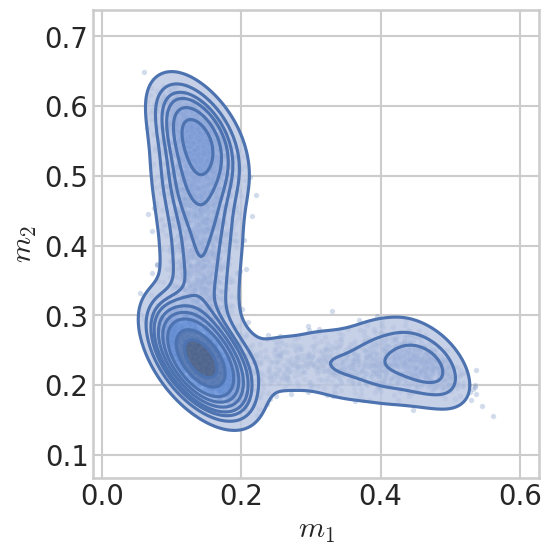

In [274]:
current_data = all_output

type1, type2 = 'at1', 'at2', 
fig = plt.figure(figsize=(6,6))
sns.scatterplot(x = current_data[type1], 
                y = current_data[type2],
                color = sns.color_palette()[0],
                alpha = 0.25,
                s = 15
               )

sns.kdeplot(x = current_data[type1], 
            y = current_data[type2],
            fill=True,
            alpha=0.8,
#             color='tab:blue'
           )

sns.kdeplot(x = current_data[type1], 
            y = current_data[type2],
#             color='tab:blue'
           )

plt.gca().set_aspect('equal')

plt.tight_layout()
plt.xlabel('$m_1$')
plt.ylabel('$m_2$')


plt.savefig("/project/biophys/scTOP analyses/Hopfield landscape paper/figs/double cusp projections (kdeplot).png", bbox_inches = "tight")

plt.show()

In [228]:
rng = np.random.default_rng()
drop_index_rv = rng.binomial(n=1, p=0.8, size=n_trials*total_time)
remaining_indices = np.where(drop_index_rv == 0)[0]
dropped_data = all_output.iloc[remaining_indices]

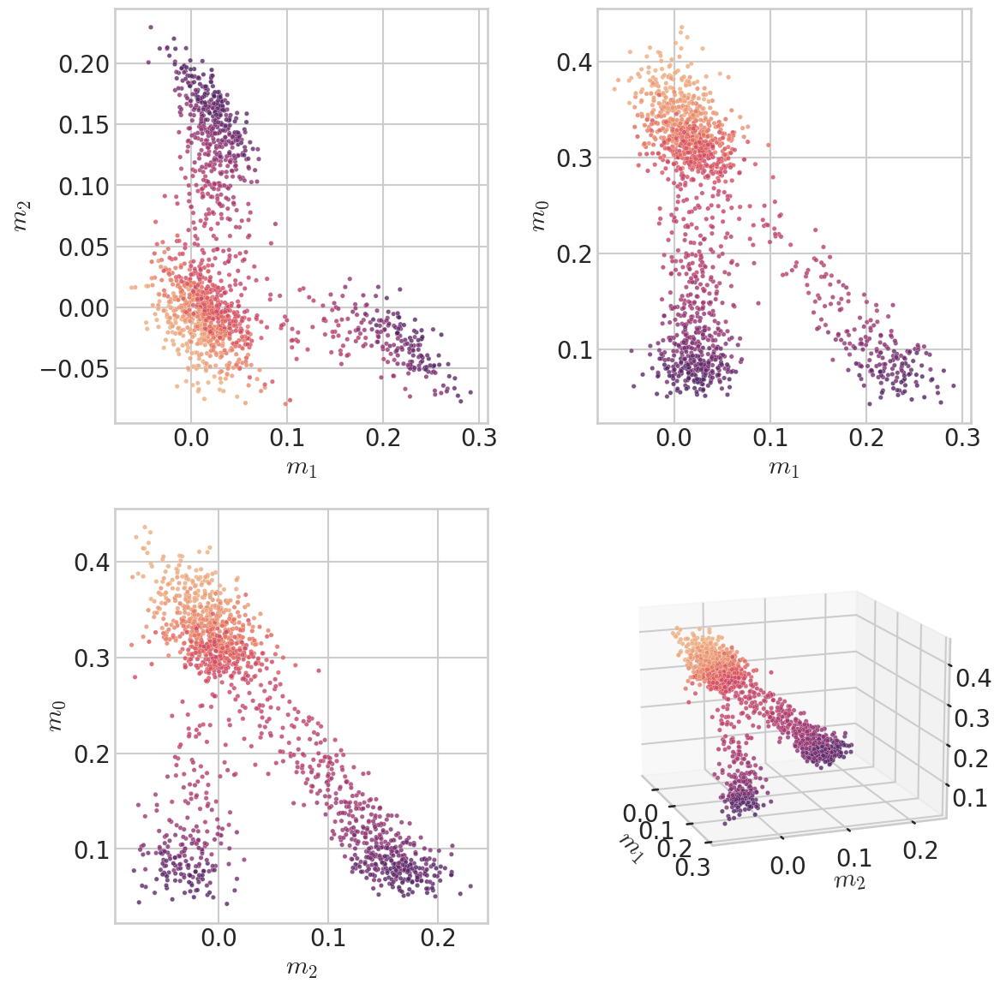

In [182]:
fig = plt.figure(figsize=(12,12))

label_dict = {'at1': '$m_1$',
              'at2': '$m_2$',
              'early epithelium': '$m_0$'
             }

kwargs = {"c": dropped_data.index,
          "cmap": sns.color_palette("flare", as_cmap=True),
          "alpha": 0.8,
          "s": 15,
          "edgecolors": 'white',
          "linewidth": 0.2
         }

for subplot_index, pair in enumerate(combinations(['at1','at2','early epithelium'], 2)):
    ax = fig.add_subplot(2, 2, subplot_index+1)

    ax.scatter(dropped_data[pair[0]], dropped_data[pair[1]], **kwargs)
    
    ax.set_xlabel(label_dict[pair[0]])
    ax.set_ylabel(label_dict[pair[1]])
               
view = [15, -20]
ax = fig.add_subplot(2, 2, 4, projection='3d')

ax.scatter(dropped_data['at1'], dropped_data['at2'], dropped_data['early epithelium'],**kwargs)
    
ax.view_init(elev=view[0], azim=view[1])

ax.set_xlabel('$m_1$', labelpad=10)
ax.set_ylabel('$m_2$', labelpad=10)
ax.set_zlabel('$m_0$', labelpad=10)
               
plt.tight_layout()

plt.savefig("/project/biophys/scTOP analyses/Hopfield landscape paper/figs/double cusp projections (colored by time).png", bbox_inches = "tight")
    
plt.show()

/scratch/248875.1.ood/ipykernel_4101279/1180461549.py:11: MatplotlibDeprecationWarning: Auto-removal of grids by pcolor() and pcolormesh() is deprecated since 3.5 and will be removed two minor releases later; please call grid(False) first.
  plt.colorbar(scalarmap, label=label, **kwargs)


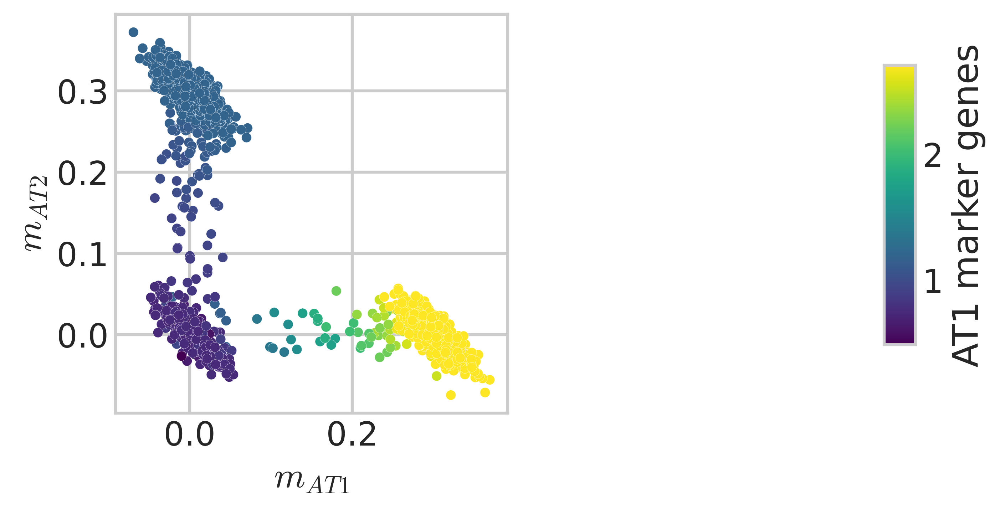

In [94]:
fig, axes = plt.subplots(1, 2, figsize=(10,4))
axes_list = axes.flatten()

hue_data = signature

hue_norm = (min(hue_data), max(hue_data))

ax = axes_list[0]

sns.scatterplot(x=all_output['at1'][::3],
                y=all_output['at2'][::3],
                hue = hue_data[::3],
                legend=False,
                palette='viridis',
                linewidth=0.1,
                s = 25,
                hue_norm = hue_norm,
                ax=ax
               )

ax.set_ylabel('$m_{AT2}$')
ax.set_xlabel('$m_{AT1}$')
ax.set_aspect('equal')
    
    
plt.tight_layout()

ax = axes_list[-1]
cmap = create_colorbar(hue_norm, 'AT1 marker genes',
                           colormap='viridis', cax = ax)

bbox=ax.get_position()
ax.set_position([bbox.x0-0.05, bbox.y0+0.12, bbox.x1 - bbox.x0, (bbox.y1 - bbox.y0)*0.7], which='both')
ax.set_aspect(4)

# plt.savefig("./figs/progenitor potential.png", bbox_inches = "tight")
plt.show()

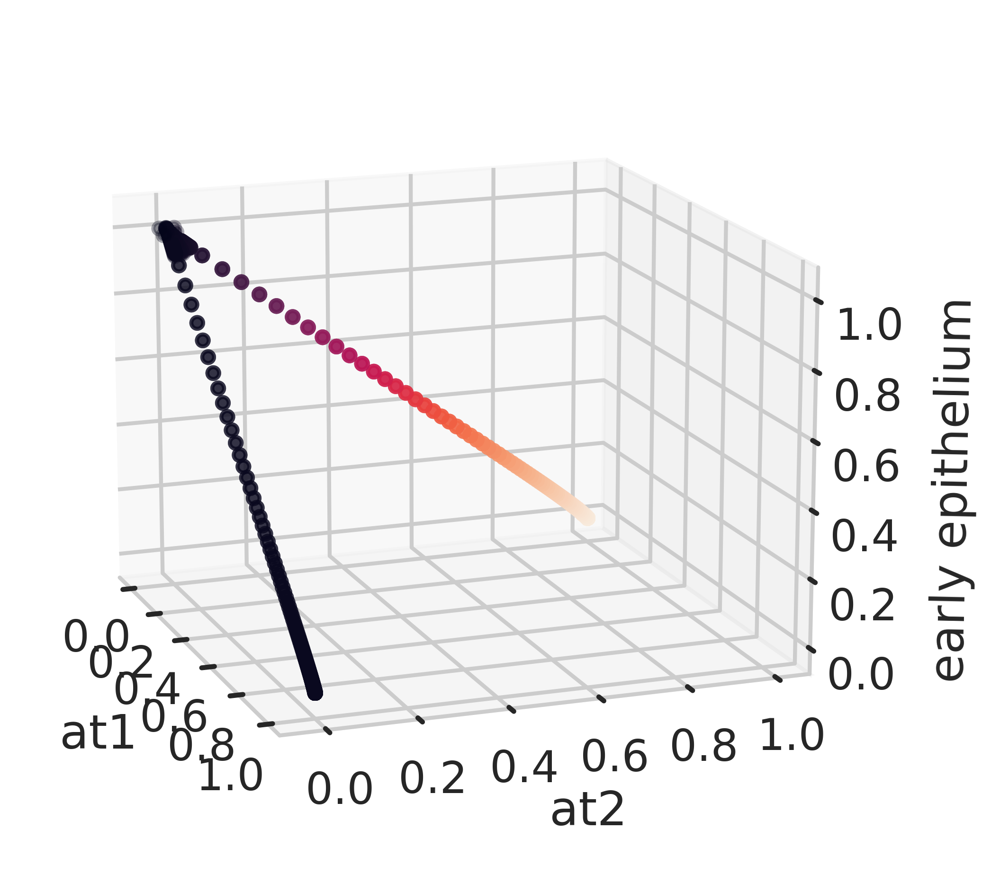

In [100]:
# Without noise

fig = plt.figure(figsize=(25,5))

ax = fig.add_subplot(1, 1, 1, projection='3d')

ax.scatter(all_output['at1'], all_output['at2'], all_output['early epithelium'],
           alpha=0.35, c=all_output['at2'])

ax.set_xlabel('at1', labelpad=10)
ax.set_ylabel('at2', labelpad=10)
ax.set_zlabel('early epithelium', labelpad=10)

ax.view_init(elev=15, azim=-20)

plt.tight_layout()

plt.savefig("/project/biophys/scTOP analyses/Hopfield landscape paper/figs/double cusp 3d noiseless.png", bbox_inches = "tight")
plt.show()

/scratch/250770.1.ood/ipykernel_439885/431014630.py:37: UserWarning: Tight layout not applied. The left and right margins cannot be made large enough to accommodate all axes decorations.
  plt.tight_layout()


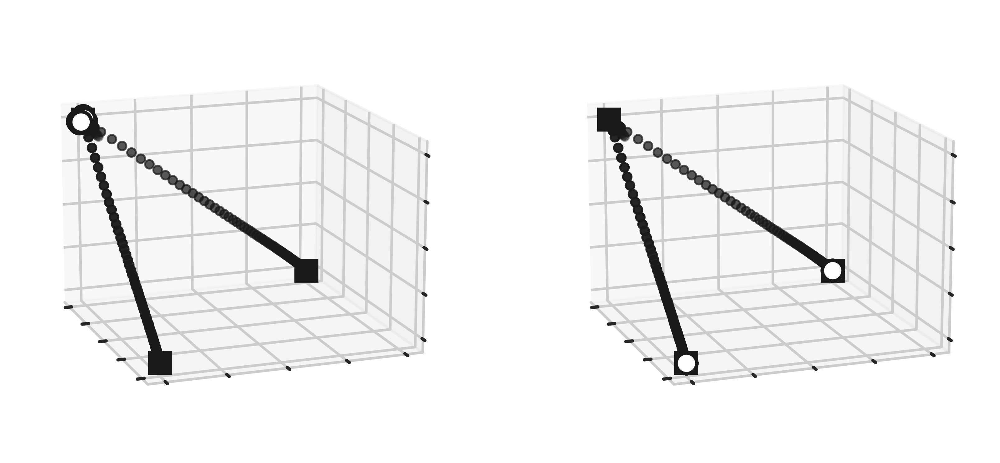

In [10]:
# Without noise

time_points = [0, 500]
num_plots = len(time_points)
fig = plt.figure(figsize=(num_plots*5,5))

for i, time_point in enumerate(time_points):
    ax = fig.add_subplot(1, num_plots, i+1, projection='3d')

    this_plot = pd.concat([all_output.iloc[time_point + i*750] for i in range(n_trials)], axis=1)
    ax.plot(this_plot.loc['at1'], 
               this_plot.loc['at2'], 
               this_plot.loc['early epithelium'], 'o',
               markerfacecolor='white', markeredgecolor='k', markeredgewidth=2, markersize=12, zorder=10)
    
    ax.plot(all_output['at1'], 
               all_output['at2'], 
               all_output['early epithelium'], 'o',
               alpha=0.35, color='k', markersize=5, zorder = 2)
    
    ax.plot([1, 0, 0], 
           [0, 1, 0], 
           [0, 0, 1], 's',
           color='k', markeredgewidth=2, markersize=12, zorder=1)

    bounds = [-0.05, 1.05]
    ax.set_xlim(bounds)
    ax.set_ylim(bounds)
    ax.set_zlim(bounds)
    
    ax.set_xticklabels([])
    ax.set_yticklabels([])
    ax.set_zticklabels([])

    ax.view_init(elev=15, azim=-20)

plt.tight_layout()

plt.savefig("/project/biophys/scTOP analyses/Hopfield landscape paper/figs/double cusp fig 2.png", bbox_inches = "tight")
plt.show()

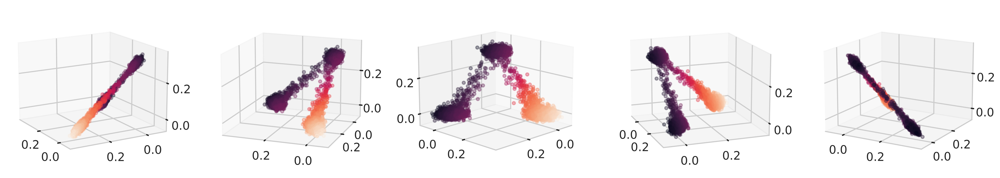

In [96]:
fig = plt.figure(figsize=(25,5))

views = [[15, 150], [15, 110], [15, 45], [15, -20], [15, -60]]
num_views = len(views)

for subplot_index, view in enumerate(views):
    ax = fig.add_subplot(1, num_views, subplot_index+1, projection='3d')

    ax.scatter(all_output['at1'], all_output['at2'], all_output['early epithelium'],
               alpha=0.35, c=all_output['at2'])

#     ax.set_xlabel('at1', labelpad=10)
#     ax.set_ylabel('at2', labelpad=10)
#     ax.set_zlabel('early epithelium', labelpad=10)
    
    ax.view_init(elev=view[0], azim=view[1])

plt.savefig("/project/biophys/scTOP analyses/Hopfield landscape paper/figs/double cusp 3d noise.png", bbox_inches = "tight")

plt.show()

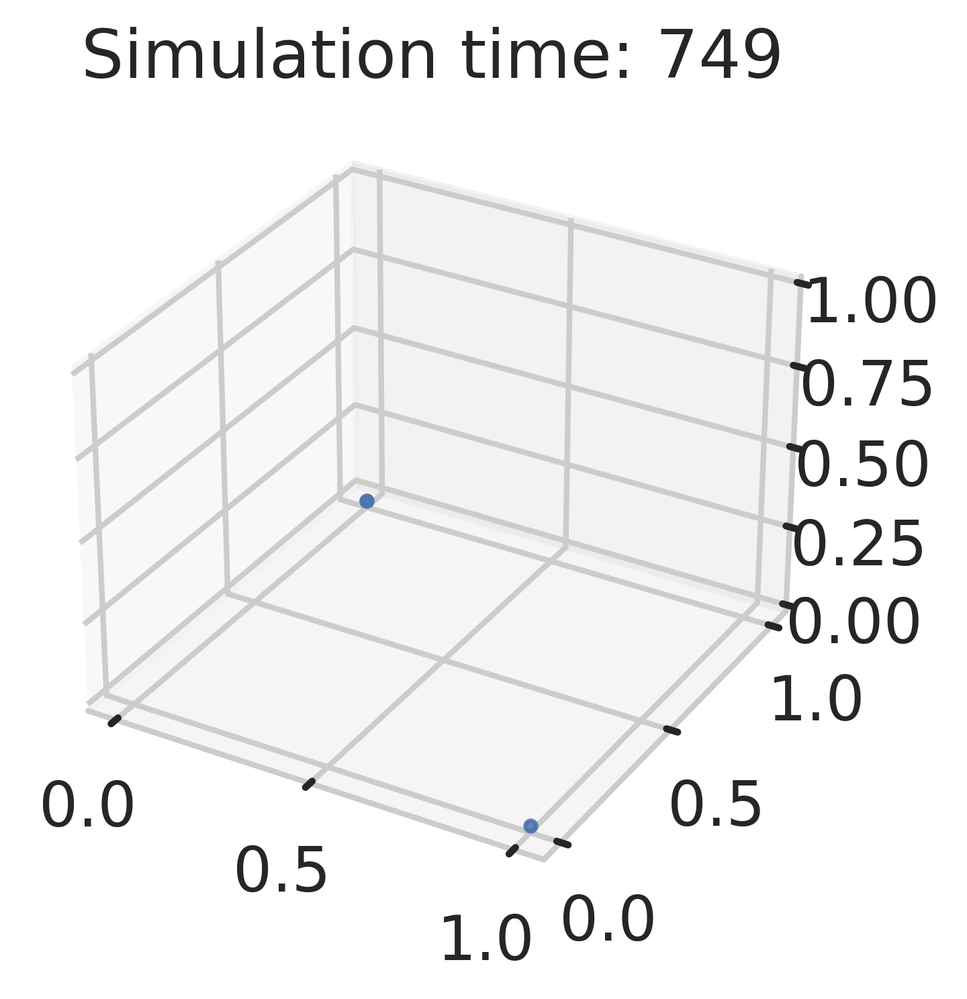

In [101]:
# Animation
from matplotlib.animation import FuncAnimation, PillowWriter
from IPython import display

typeX = 'at1' 
typeY = 'at2'
typeZ = 'early epithelium'
    
time_points = range(total_time)
bounds = [-0.05, 0.4]
 
fig = plt.figure()
ax = fig.add_subplot(111, projection='3d')
# ax.view_init(elev=15, azim=-20)
# xdata, ydata = [], []
graph, = ax.plot([], [], [], 'bo', linestyle="", markersize=3, alpha=0.4)
 
def init():
#     ax.set_xlim(bounds)
#     ax.set_ylim(bounds)
#     ax.set_zlim(bounds)

#     ax.set_xlabel("AT1", labelpad=10)
#     ax.set_ylabel("AT2", labelpad=10)
#     ax.set_zlabel("Early epithelium", labelpad=10)
    return graph,
 
def update(time_point):
    frame_data = pd.concat([all_output.iloc[time_point + i*750] for i in range(n_trials)], axis=1)
    graph.set_data(frame_data.loc[typeX], frame_data.loc[typeY])
    graph.set_3d_properties(frame_data.loc[typeZ])

    ax.set_title('Simulation time: {}'.format(time_point))
    return graph, 
 
ani = FuncAnimation(fig, update, frames=time_points, init_func=init, blit=True, interval=40)

ani.save("/project/biophys/scTOP analyses/Hopfield landscape paper/figs/3D double cusp animation (without noise).gif", dpi=300, writer=PillowWriter(fps=30))

/scratch/247049.1.ood/ipykernel_261368/1681958240.py:23: MatplotlibDeprecationWarning: Auto-removal of grids by pcolor() and pcolormesh() is deprecated since 3.5 and will be removed two minor releases later; please call grid(False) first.
  plt.colorbar()


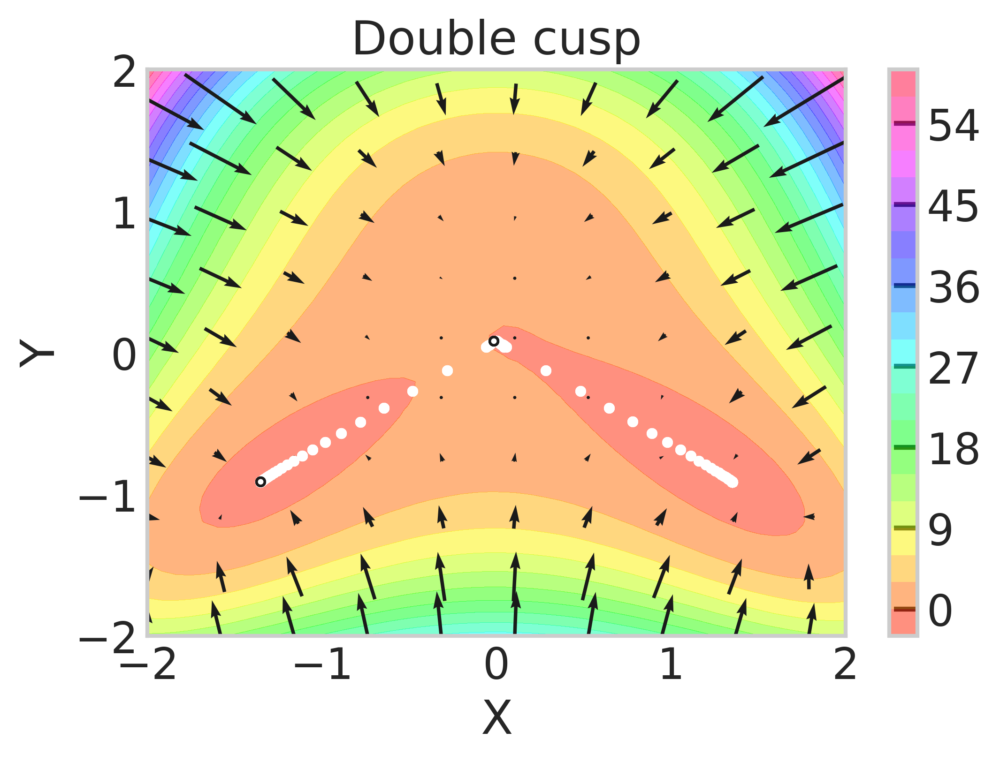

In [90]:
# plot the potential in x, y coords (can also plot as fn of m)

def potential_function(x, y, f, k):
    return x**4 + y**4 - y**3 + 4*y*x**2 + y**2 + f*x - k*y

def potential_grad(x, y, f, k):
    grad_x = 4*x**3 + 8*x*y + f
    grad_y = 4*y**3 - 3*y**2 + 4*x**2 + 2*y - k
    return -grad_x, -grad_y

time = 750

x = np.linspace(-2, 2, 50)
y = np.linspace(-2, 2, 50)
X, Y = np.meshgrid(x, y)
# plt.figure(figsize=(8, 8))

f, k = -0.1, 0.15

Z = potential_function(X, Y, f, k)

plt.contourf(X, Y, Z, cmap="hsv", levels=20, alpha=0.5)
plt.colorbar()

x = np.linspace(-2, 2, 20)
y = np.linspace(-2, 2, 20)
X, Y = np.meshgrid(x, y)

U, V = potential_grad(X, Y, f, k)
speed = np.sqrt(U**2 + V**2)

# plt.quiver(X, Y, U, V, color='grey')
# lw = 5*speed / speed.max()
# plt.streamplot(X, Y, U, V, color = 'grey', density=1, linewidth=lw)

plt.quiver(X[::2, ::2], Y[::2, ::2], U[::2, ::2], V[::2, ::2],
           scale_units="inches", scale=100, width=0.005, pivot="mid")

# plt.scatter(x = [attractor_network.x0, attractor_network.x1, -attractor_network.x1],
#             y= [attractor_network.y0, attractor_network.y1, attractor_network.y1],
#             s=200, facecolors='none', edgecolors='k'
# )
# sns.scatterplot(x=attractor_network.h12.dot(output[['a0', 'a1', 'a2']].T), y=attractor_network.h0.dot(output[['a0', 'a1', 'a2']].T) + attractor_network.y1, 
#     hue=time_array, edgecolor=None)


df = all_output.T

ones_row = pd.DataFrame(np.ones((all_output.shape[0]))).T
ones_row.columns = df.columns
df = pd.concat([df, ones_row], axis=0)

X = np.dot(attractor_network.hx, df)
Y = np.dot(attractor_network.hy, df)


# sns.scatterplot(x=X[::3], y=Y[::3], hue=np.tile(time_array, n_trials)[::3], 
#                 s=10, palette = 'mako_r', legend=False, zorder=2)

plt.scatter(x=X[::4], y=Y[::4], 
                s=10, color='white', zorder=3, linewidth=1)

plt.scatter(x=X[::time], y=Y[::time], 
                s=10, facecolors='white', edgecolor='k', zorder=3, linewidth=1)

plt.grid(False)

# Add labels and title
plt.xlabel('X')
plt.ylabel('Y')
plt.title('Double cusp')

# Show the plot
# plt.colorbar(label='Potential (V)')
plt.show()

# Heteroclinic flip simulations

In [264]:
n_trials = 10
output_list = []
gene_list = []
signature_list = []
rng = np.random.default_rng()

total_time = 750

landscape_args = {'start_params': {'f': 0, 'k': 0.5},
                  'attractor_coords': [[0, het_flip_coords['y0']], [het_flip_coords['x1'], het_flip_coords['y1']]],
                  'gradients': het_flip_grad,
                 }

dynamics_args = {'stored_states': attractor_states.T,
                 'rhos': [0.0, 10]
                }

for trial in trange(n_trials):
    # generate new initial coordinates for each trial
    dynamics_args['initial_state'] =  attractor_states['early epithelium'] + rng.standard_normal(size=N)

    attractor_network = AttractorNetwork(dynamics_args, landscape_args)
   
    simulation_args = {'total_time': total_time,
                        'signal_bounds': {'start': {'f': 450, 'k': 100},
                                          'end':   {'f': 600, 'k': 500}},
                        'finish_params': {'f': rng.choice([-0.5, 0.5]), 'k': 2},
                        'recorded_genes': ['Sftpc', *AT1_signature],
                        'add_noise': True
                        }
    
    output = attractor_network.simulate(**simulation_args)
    AT1_signatures = output[AT1_signature].mean(axis=1)
    output_list += [output.iloc[:, :3]]
    gene_list += [output[['Sftpc','Aqp5']]]
    signature_list += [AT1_signatures]

all_output = pd.concat(output_list, axis=0)
all_genes = pd.concat(gene_list, axis=0)
signature = pd.concat(signature_list, axis=0)

100%|██████████| 10/10 [00:33<00:00,  3.37s/it]


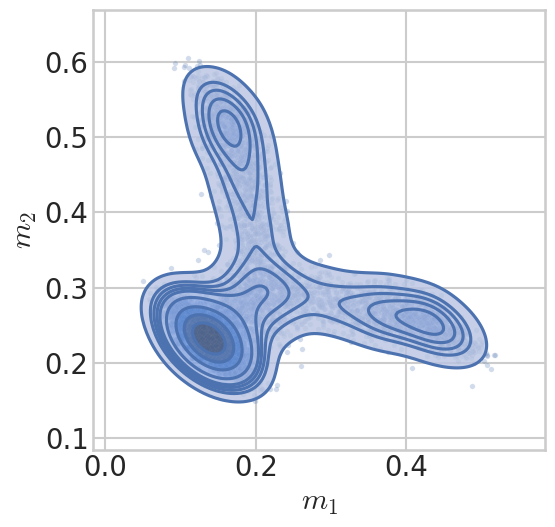

In [268]:
current_data = all_output

type1, type2 = 'at1', 'at2', 
fig = plt.figure(figsize=(6,6))
sns.scatterplot(x = current_data[type1], 
                y = current_data[type2],
                color = sns.color_palette()[0],
                alpha = 0.25,
                s = 15
               )

sns.kdeplot(x = current_data[type1], 
            y = current_data[type2],
            fill=True,
            alpha=0.8,
#             color='tab:blue'
           )

sns.kdeplot(x = current_data[type1], 
            y = current_data[type2],
#             color='tab:blue'
           )

plt.gca().set_aspect('equal')

plt.tight_layout()
plt.xlabel('$m_1$')
plt.ylabel('$m_2$')


plt.savefig("/project/biophys/scTOP analyses/Hopfield landscape paper/figs/heteroclinic flip projections (kdeplot).png", bbox_inches = "tight")

plt.show()

In [265]:
rng = np.random.default_rng()
drop_index_rv = rng.binomial(n=1, p=0.8, size=n_trials*total_time)
remaining_indices = np.where(drop_index_rv == 0)[0]
dropped_data = all_output.iloc[remaining_indices]

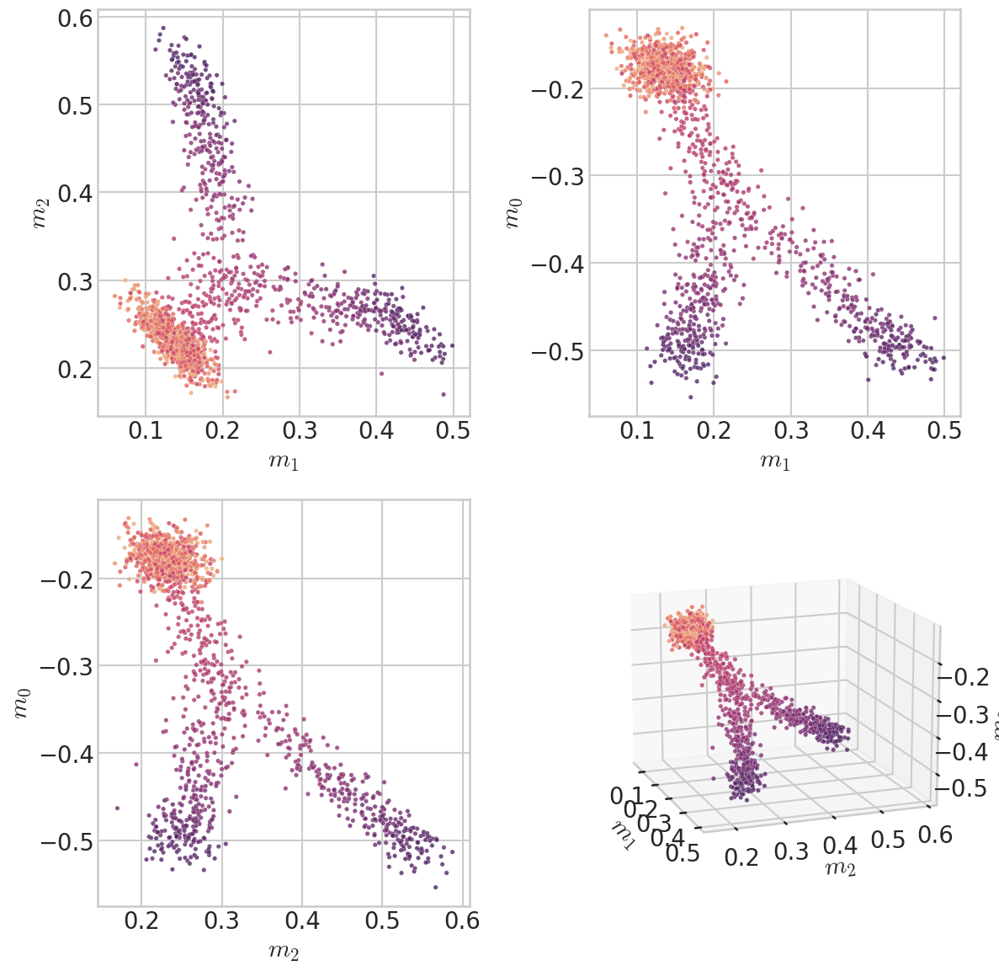

In [266]:
fig = plt.figure(figsize=(12,12))

label_dict = {'at1': '$m_1$',
              'at2': '$m_2$',
              'early epithelium': '$m_0$'
             }

kwargs = {"c": dropped_data.index,
          "cmap": sns.color_palette("flare", as_cmap=True),
          "alpha": 0.8,
          "s": 15,
          "edgecolors": 'white',
          "linewidth": 0.2
         }

for subplot_index, pair in enumerate(combinations(['at1','at2','early epithelium'], 2)):
    ax = fig.add_subplot(2, 2, subplot_index+1)

    ax.scatter(dropped_data[pair[0]], dropped_data[pair[1]], **kwargs)
    
    ax.set_xlabel(label_dict[pair[0]])
    ax.set_ylabel(label_dict[pair[1]])
               
view = [15, -20]
ax = fig.add_subplot(2, 2, 4, projection='3d')

ax.scatter(dropped_data['at1'], dropped_data['at2'], dropped_data['early epithelium'],**kwargs)
    
ax.view_init(elev=view[0], azim=view[1])

ax.set_xlabel('$m_1$', labelpad=10)
ax.set_ylabel('$m_2$', labelpad=10)
ax.set_zlabel('$m_0$', labelpad=10)
               
plt.tight_layout()

# plt.savefig("/project/biophys/scTOP analyses/Hopfield landscape paper/figs/heteroclinic flip projections (colored by time).png", bbox_inches = "tight")
    
plt.show()

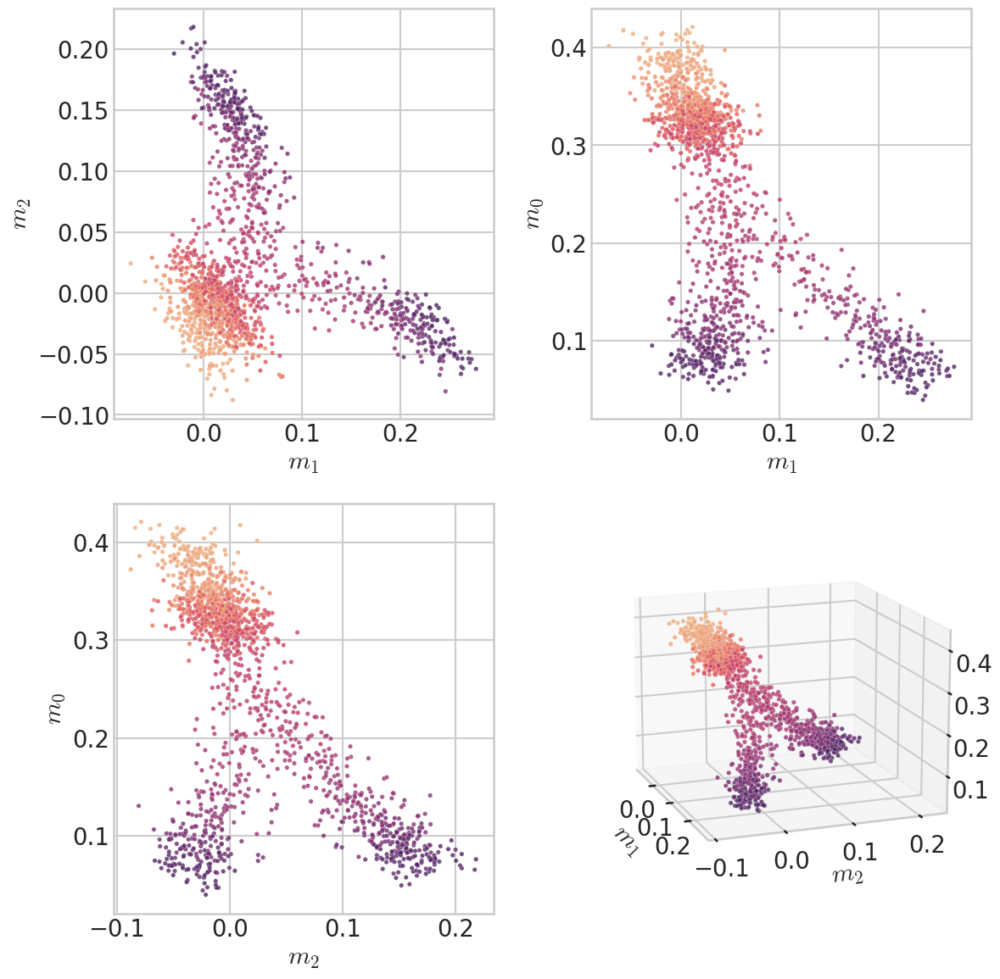

In [216]:
fig = plt.figure(figsize=(12,12))

label_dict = {'at1': '$m_1$',
              'at2': '$m_2$',
              'early epithelium': '$m_0$'
             }

kwargs = {"c": dropped_data.index,
          "cmap": sns.color_palette("flare", as_cmap=True),
          "alpha": 0.8,
          "s": 15,
          "edgecolors": 'white',
          "linewidth": 0.2
         }

for subplot_index, pair in enumerate(combinations(['at1','at2','early epithelium'], 2)):
    ax = fig.add_subplot(2, 2, subplot_index+1)

    ax.scatter(dropped_data[pair[0]], dropped_data[pair[1]], **kwargs)
    
    ax.set_xlabel(label_dict[pair[0]])
    ax.set_ylabel(label_dict[pair[1]])
               
view = [15, -20]
ax = fig.add_subplot(2, 2, 4, projection='3d')

ax.scatter(dropped_data['at1'], dropped_data['at2'], dropped_data['early epithelium'],**kwargs)
    
ax.view_init(elev=view[0], azim=view[1])

ax.set_xlabel('$m_1$', labelpad=10)
ax.set_ylabel('$m_2$', labelpad=10)
ax.set_zlabel('$m_0$', labelpad=10)
               
plt.tight_layout()

plt.savefig("/project/biophys/scTOP analyses/Hopfield landscape paper/figs/heteroclinic flip projections (colored by time).png", bbox_inches = "tight")
    
plt.show()

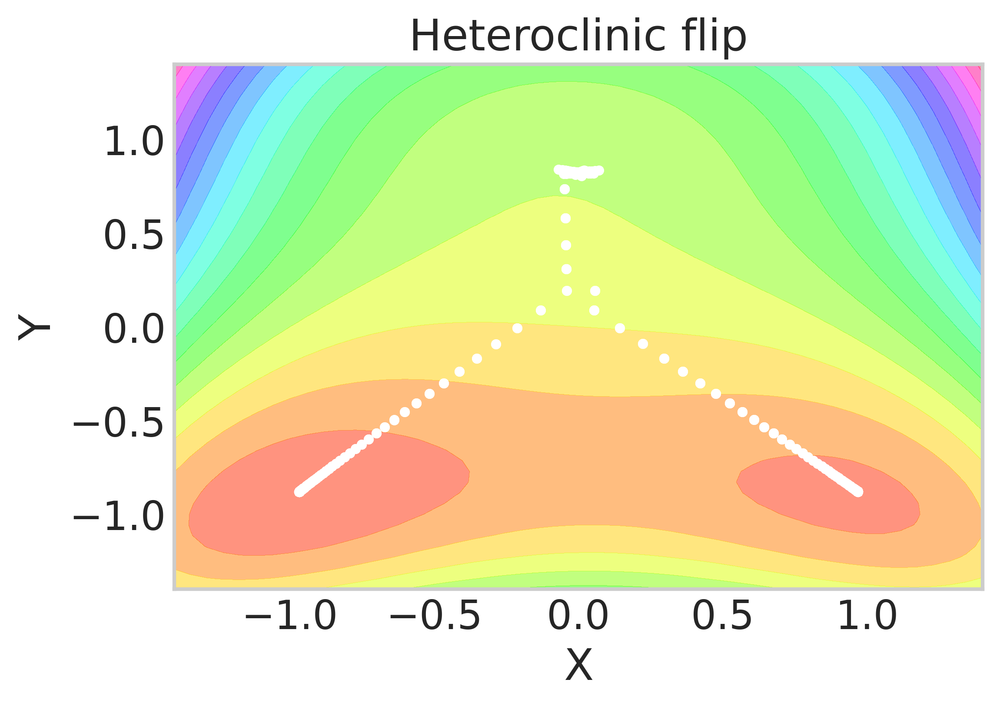

In [119]:
# plot the potential in x, y coords (can also plot as fn of m)

def potential_function(x, y, f, k):
    return x**4 + y**4 - y**3 + 2*y*x**2 - y**2 + f*x + k*y

def potential_grad(x, y, f, k):
    grad_x = 4*x**3 + 4*x*y + f
    grad_y = 4*y**3 - 3*y**2 + 2*x**2 - 2*y + k
    return -grad_x, -grad_y

x = np.linspace(-1.4, 1.4, 50)
y = np.linspace(-1.4, 1.4, 50)
X, Y = np.meshgrid(x, y)
# plt.figure(figsize=(8, 8))

f, k = 0.2, 2

Z = potential_function(X, Y, f, k)

plt.contourf(X, Y, Z, cmap="hsv", levels=20, alpha=0.5)

df = all_output[['at1', 'at2', 'early epithelium']].T

ones_row = pd.DataFrame(np.ones((all_output.shape[0]))).T
ones_row.columns = df.columns
df = pd.concat([df, ones_row], axis=0)

X = np.dot(attractor_network.hx, df)
Y = np.dot(attractor_network.hy, df)

plt.scatter(x=X[::4], y=Y[::4], 
                s=10, color='white', zorder=3, linewidth=1)


plt.grid(False)

# Add labels and title
plt.xlabel('X')
plt.ylabel('Y')
plt.title('Heteroclinic flip')

# Show the plot
# plt.colorbar(label='Potential (V)')
plt.show()

/scratch/249319.1.ood/ipykernel_3785488/1191066041.py:37: UserWarning: Tight layout not applied. The left and right margins cannot be made large enough to accommodate all axes decorations.
  plt.tight_layout()


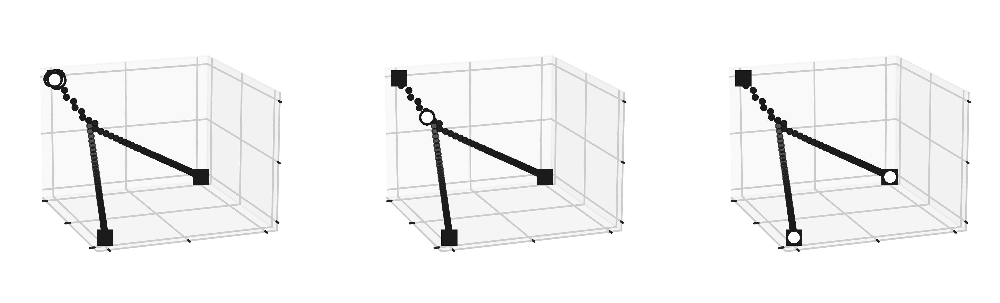

In [11]:
# Without noise

time_points = [0, 140, 500]
num_plots = len(time_points)
fig = plt.figure(figsize=(num_plots*5,5))

for i, time_point in enumerate(time_points):
    ax = fig.add_subplot(1, num_plots, i+1, projection='3d')

    this_plot = pd.concat([all_output.iloc[time_point + i*750] for i in range(n_trials)], axis=1)
    ax.plot(this_plot.loc['at1'], 
               this_plot.loc['at2'], 
               this_plot.loc['early epithelium'], 'o',
               markerfacecolor='white', markeredgecolor='k', markeredgewidth=2, markersize=12, zorder=10)
    
    ax.plot(all_output['at1'], 
               all_output['at2'], 
               all_output['early epithelium'], 'o',
               alpha=0.35, color='k', markersize=5, zorder = 2)
    
    ax.plot([1, 0, 0], 
           [0, 1, 0], 
           [0, 0, 1], 's',
           color='k', markeredgewidth=2, markersize=12, zorder=1)

    bounds = [-0.05, 1.05]
    ax.set_xlim(bounds)
    ax.set_ylim(bounds)
    ax.set_zlim(bounds)
    
    ax.set_xticklabels([])
    ax.set_yticklabels([])
    ax.set_zticklabels([])

    ax.view_init(elev=15, azim=-20)

plt.tight_layout()

plt.savefig("/project/biophys/scTOP analyses/Hopfield landscape paper/figs/heteroclinic flip fig 2.png", bbox_inches = "tight")
plt.show()

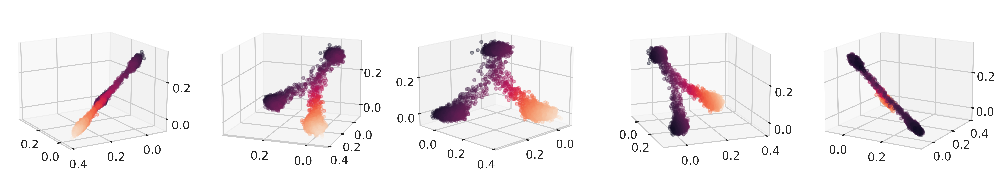

In [124]:
fig = plt.figure(figsize=(25,5))

views = [[15, 150], [15, 110], [15, 45], [15, -20], [15, -60]]
num_views = len(views)

for subplot_index, view in enumerate(views):
    ax = fig.add_subplot(1, num_views, subplot_index+1, projection='3d')

    ax.scatter(all_output['at1'], all_output['at2'], all_output['early epithelium'],
               alpha=0.35, c=all_output['at2'])

#     ax.set_xlabel('at1', labelpad=10)
#     ax.set_ylabel('at2', labelpad=10)
#     ax.set_zlabel('early epithelium', labelpad=10)
    
    ax.view_init(elev=view[0], azim=view[1])

plt.savefig("/project/biophys/scTOP analyses/Hopfield landscape paper/figs/heteroclinic flip 3d noise.png", bbox_inches = "tight")

plt.show()

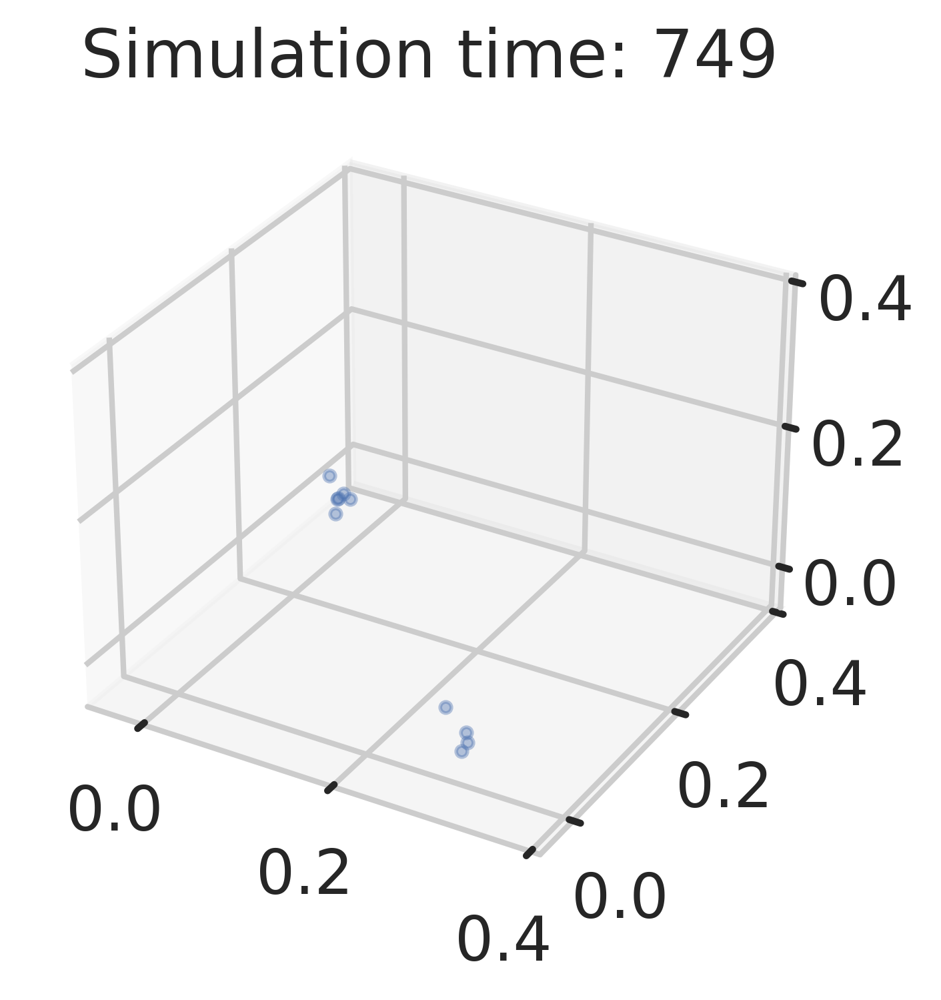

In [125]:
# Animation
from matplotlib.animation import FuncAnimation, PillowWriter
from IPython import display

typeX = 'at1' 
typeY = 'at2'
typeZ = 'early epithelium'
    
time_points = range(total_time)
bounds = [-0.05, 0.4]
 
fig = plt.figure()
ax = fig.add_subplot(111, projection='3d')
# ax.view_init(elev=15, azim=-20)
# xdata, ydata = [], []
graph, = ax.plot([], [], [], 'bo', linestyle="", markersize=3, alpha=0.4)
 
def init():
    ax.set_xlim(bounds)
    ax.set_ylim(bounds)
    ax.set_zlim(bounds)

#     ax.set_xlabel("AT1", labelpad=10)
#     ax.set_ylabel("AT2", labelpad=10)
#     ax.set_zlabel("Early epithelium", labelpad=10)
    return graph,
 
def update(time_point):
    frame_data = pd.concat([all_output.iloc[time_point + i*750] for i in range(n_trials)], axis=1)
    graph.set_data(frame_data.loc[typeX], frame_data.loc[typeY])
    graph.set_3d_properties(frame_data.loc[typeZ])

    ax.set_title('Simulation time: {}'.format(time_point))
    return graph, 
 
ani = FuncAnimation(fig, update, frames=time_points, init_func=init, blit=True, interval=40)

ani.save("/project/biophys/scTOP analyses/Hopfield landscape paper/figs/3D heteroclinic flip animation (with noise).gif",
         dpi=300, writer=PillowWriter(fps=30))

In [126]:
def simulate_rhos(rho_delta, rho_p):
    n_trials = 2
    output_list = []
    rng = np.random.default_rng()

    total_time = 750

    landscape_args = {'start_params': {'f': 0, 'k': 0.5},
                      'attractor_coords': [[0, het_flip_coords['y0']], [het_flip_coords['x1'], het_flip_coords['y1']]],
                      'gradients': het_flip_grad,
                     }

    dynamics_args = {'stored_states': attractor_states.T,
                     'rhos': [rho_delta, rho_p]
                    }

    for trial in trange(n_trials):
        # generate new initial coordinates for each trial
        dynamics_args['initial_state'] =  attractor_states['early epithelium'] + rng.standard_normal(size=N)

        attractor_network = AttractorNetwork(dynamics_args, landscape_args)

        simulation_args = {'total_time': total_time,
                            'signal_bounds': {'start': {'f': 100, 'k': 100},
                                              'end':   {'f': 150, 'k': 150}},
                            'finish_params': {'f': 0, 'k': 2},
                            'recorded_genes': ['Sftpc', *AT1_signature],
    #                         'add_noise': True
                            }

        output = attractor_network.simulate(**simulation_args)
        
        output_list += [output.iloc[:, :3]]

    all_output = pd.concat(output_list, axis=0)
    return all_output, attractor_network

0it [00:00, ?it/s]
100%|██████████| 2/2 [00:04<00:00,  2.34s/it]
1it [00:04,  4.71s/it]
100%|██████████| 2/2 [00:04<00:00,  2.32s/it]
2it [00:09,  4.68s/it]
100%|██████████| 2/2 [00:04<00:00,  2.34s/it]
3it [00:14,  4.69s/it]
100%|██████████| 2/2 [00:04<00:00,  2.35s/it]
4it [00:18,  4.70s/it]


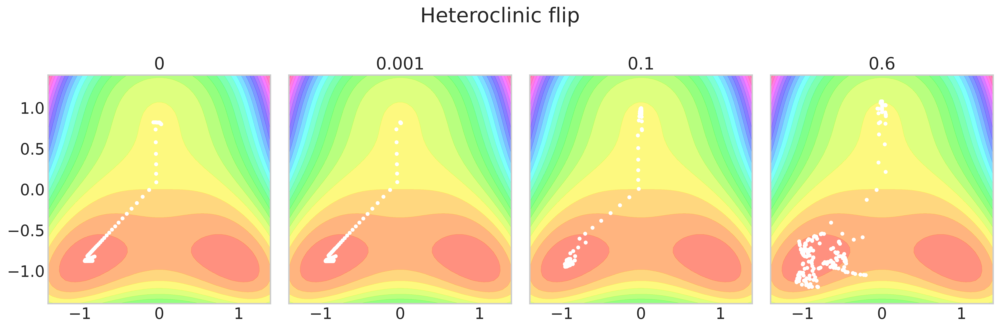

In [127]:
# plot the potential in x, y coords (can also plot as fn of m)

def potential_function(x, y, f, k):
    return x**4 + y**4 - y**3 + 2*y*x**2 - y**2 + f*x + k*y

def potential_grad(x, y, f, k):
    grad_x = 4*x**3 + 4*x*y + f
    grad_y = 4*y**3 - 3*y**2 + 2*x**2 - 2*y + k
    return -grad_x, -grad_y

fig, axes = plt.subplots(1, 4, sharex=True, sharey=True, figsize=(15,5))
axes_list = axes.flatten()

rho_deltas = [0, 0.001, 0.1, 0.6]

for rho_delt, ax in tqdm(zip(rho_deltas, axes_list)):
    output, attractor_network = simulate_rhos(rho_delt, 10)

    ylims = 1.4

    x = np.linspace(-1.4, 1.4, 50)
    y = np.linspace(-ylims, ylims, 50)
    X, Y = np.meshgrid(x, y)
    f, k = 0, 1.55

    Z = potential_function(X, Y, f, k)

    ax.contourf(X, Y, Z, cmap="hsv", levels=20, alpha=0.5)
    
    df = output[['at1', 'at2', 'early epithelium']].T

    ones_row = pd.DataFrame(np.ones((output.shape[0]))).T
    ones_row.columns = df.columns
    df = pd.concat([df, ones_row], axis=0)

    X = np.dot(attractor_network.hx, df)
    Y = np.dot(attractor_network.hy, df)

    ax.scatter(x=X[::4], y=Y[::4], 
                    s=10, color='white', zorder=3, linewidth=1)

#     ax.scatter(x=X[::time], y=Y[::time], 
#                     s=10, facecolors='white', edgecolor='k', zorder=3, linewidth=1)

    ax.grid(False)
    ax.set_title(rho_delt)

# plt.xlabel('X')
# plt.ylabel('Y')
plt.suptitle('Heteroclinic flip')
plt.tight_layout()

plt.show()

0it [00:00, ?it/s]
100%|██████████| 2/2 [00:04<00:00,  2.48s/it]
1it [00:04,  4.98s/it]
100%|██████████| 2/2 [00:04<00:00,  2.43s/it]
2it [00:09,  4.92s/it]
100%|██████████| 2/2 [00:04<00:00,  2.44s/it]
3it [00:14,  4.92s/it]


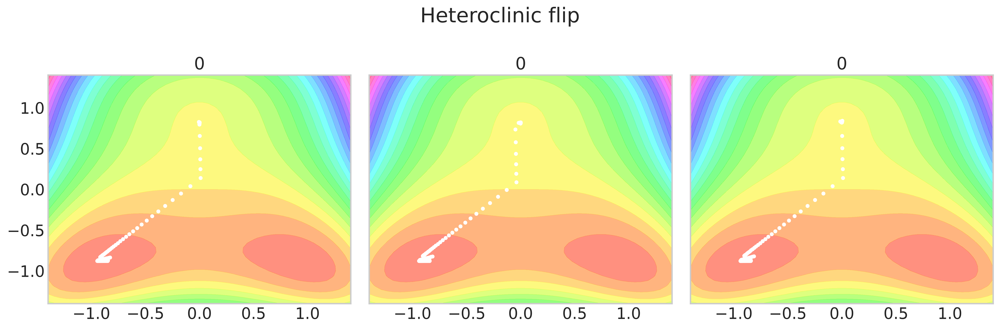

In [68]:
# plot the potential in x, y coords (can also plot as fn of m)

def potential_function(x, y, f, k):
    return x**4 + y**4 - y**3 + 2*y*x**2 - y**2 + f*x + k*y

def potential_grad(x, y, f, k):
    grad_x = 4*x**3 + 4*x*y + f
    grad_y = 4*y**3 - 3*y**2 + 2*x**2 - 2*y + k
    return -grad_x, -grad_y

fig, axes = plt.subplots(1, 3, sharex=True, sharey=True, figsize=(15,5))
axes_list = axes.flatten()

rho_ps = [1, 10, 1000]

for rho_p, ax in tqdm(zip(rho_ps, axes_list)):
    output, attractor_network = simulate_rhos(0, rho_p)

    ylims = 1.4

    x = np.linspace(-1.4, 1.4, 50)
    y = np.linspace(-ylims, ylims, 50)
    X, Y = np.meshgrid(x, y)
    f, k = 0, 1.55

    Z = potential_function(X, Y, f, k)

    ax.contourf(X, Y, Z, cmap="hsv", levels=20, alpha=0.5)
    
    df = output[['at1', 'at2', 'early epithelium']].T

    ones_row = pd.DataFrame(np.ones((output.shape[0]))).T
    ones_row.columns = df.columns
    df = pd.concat([df, ones_row], axis=0)

    X = np.dot(attractor_network.hx, df)
    Y = np.dot(attractor_network.hy, df)

    ax.scatter(x=X[::4], y=Y[::4], 
                    s=10, color='white', zorder=3, linewidth=1)

#     ax.scatter(x=X[::time], y=Y[::time], 
#                     s=10, facecolors='white', edgecolor='k', zorder=3, linewidth=1)

    ax.grid(False)
    ax.set_title(rho_delt)

# plt.xlabel('X')
# plt.ylabel('Y')
plt.suptitle('Heteroclinic flip')
plt.tight_layout()

plt.show()